# WTA Match Predictor — EDA y Feature Engineering
Pipeline completo: carga, limpieza, clasificación de torneos, cálculo de features derivadas y generación del dataset de entrenamiento.

## 1. Imports y carga de datos

In [3]:
import pandas as pd
import numpy as np
import os
from ydata_profiling import ProfileReport

c:\Users\NaiaJon\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\NaiaJon\AppData\Local\Temp\ipykernel_22896\1618932038.py:4: DeprecationWarning: 
    `import ydata_profiling` is deprecated and will not receive more updates. 
    Please install fg-data-profiling via `pip install fg-data-profiling` and use `import data_profiling` instead.
    
  from ydata_profiling import ProfileReport


In [ ]:
#!pip install kagglehub

     ---------------------------------------- 0.0/40.1 kB ? eta -:--:--
     ------------------- ------------------ 20.5/40.1 kB 217.9 kB/s eta 0:00:01
     -------------------------------------- 40.1/40.1 kB 317.6 kB/s eta 0:00:00
   ---------------------------------------- 0.0/70.6 kB ? eta -:--:--
   ---------------------------------------- 70.6/70.6 kB 1.9 MB/s eta 0:00:00
   ---------------------------------------- 0.0/217.8 kB ? eta -:--:--
   ---------------------------------------  215.0/217.8 kB 4.4 MB/s eta 0:00:01
   ---------------------------------------- 217.8/217.8 kB 3.3 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.0 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
# Descarga de Kaggle actualizado
import kagglehub

# Download latest version
path = kagglehub.dataset_download("dissfya/wta-tennis-2007-2023-daily-update")

print("Path to dataset files:", path)

100%|██████████| 1.03M/1.03M [00:00<00:00, 2.34MB/s]

Extracting files...
Path to dataset files: C:\Users\NaiaJon\.cache\kagglehub\datasets\dissfya\wta-tennis-2007-2023-daily-update\versions\1062


In [8]:
# Cuidado con las rutas al copiarlo al gihub
file_path = os.path.join(path, "wta.csv")
wta = pd.read_csv(file_path, low_memory=False)
print(f'Partidos cargados: {len(wta)}')
wta.tail()

Partidos cargados: 44446


,Tournament,Date,Court,Surface,Round,Best of,Player_1,Player_2,Winner,Rank_1,Rank_2,Pts_1,Pts_2,Odd_1,Odd_2,Score
44441,Mutua Madrid Open,2026-04-29 00:00:00,Outdoor,Clay,Quarterfinals,3,Pliskova Ka.,Potapova A.,Potapova A.,197,56,375,1065,2.5,1.53,1-6 7-6 3-6
44442,Mutua Madrid Open,2026-04-29 00:00:00,Outdoor,Clay,Quarterfinals,3,Kostyuk M.,Noskova L.,Kostyuk M.,23,13,1722,2849,1.5,2.63,7-6 6-0
44443,Mutua Madrid Open,2026-04-30 00:00:00,Outdoor,Clay,Semifinals,3,Baptiste H.,Andreeva M.,Andreeva M.,32,8,1392,3746,2.63,1.5,4-6 6-7
44444,Mutua Madrid Open,2026-04-30 00:00:00,Outdoor,Clay,Semifinals,3,Kostyuk M.,Potapova A.,Kostyuk M.,23,56,1722,1065,1.33,3.4,6-2 1-6 6-1
44445,Mutua Madrid Open,2026-05-02 00:00:00,Outdoor,Clay,The Final,3,Andreeva M.,Kostyuk M.,Kostyuk M.,8,23,3746,1722,1.67,2.2,3-6 5-7


## 2. Exploración inicial

In [9]:
wta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44446 entries, 0 to 44445
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Tournament  44446 non-null  object
 1   Date        44446 non-null  object
 2   Court       44446 non-null  object
 3   Surface     44446 non-null  object
 4   Round       44446 non-null  object
 5   Best of     44446 non-null  int64 
 6   Player_1    44446 non-null  object
 7   Player_2    44446 non-null  object
 8   Winner      44446 non-null  object
 9   Rank_1      44446 non-null  int64 
 10  Rank_2      44446 non-null  int64 
 11  Pts_1       44446 non-null  int64 
 12  Pts_2       44446 non-null  int64 
 13  Odd_1       44446 non-null  object
 14  Odd_2       44446 non-null  object
 15  Score       44446 non-null  object
dtypes: int64(5), object(11)
memory usage: 5.4+ MB


In [ ]:
# Profiling completo — genera wta_report.html
profile = ProfileReport(wta, title='WTA Profiling Report')
profile.to_file('wta_report.html')

## 3. Limpieza y transformaciones

In [10]:
# Eliminar columnas no útiles para el modelo
# Court: muy desbalanceado (40k outdoor vs 400 indoor), la superficie ya lo captura
# Best of: en WTA siempre es al mejor de 3 sets
wta = wta.drop(columns=['Court', 'Best of'])

In [11]:
# Unificar superficies: Greenset y Carpet tienen muy pocas entradas y son pistas rápidas → Hard
wta['Surface'] = wta['Surface'].replace({'Greenset': 'Hard', 'Carpet': 'Hard'})
print(wta['Surface'].value_counts())

Surface
Hard     27290
Clay     12347
Grass     4809
Name: count, dtype: int64


In [12]:
# Clasificar torneos por categoría usando palabras clave
# Los nombres cambian con patrocinadores pero la ciudad/torneo es estable

def clasificar_torneo(nombre):
    n = nombre.lower()
    
    if any(x in n for x in ['australian open', 'roland garros', 'french open',
                              'wimbledon', 'us open']):
        return 'GS'
    
    if any(x in n for x in ['wta finals', 'wta elite trophy', 'championships',
                              'tournament of champions', 'riyadh finals', 'wta tour championships']):
        return 'WTA_Finals'
    
    if any(x in n for x in ['indian wells', 'miami', 'madrid', 'roma', 'rome',
                              'internazionali', 'canada', 'toronto', 'rogers',
                              'canadian', 'cincinnati', 'beijing', 'china open',
                              'wuhan', 'doha', 'qatar', 'dubai', 'bnp paribas open',
                              'national bank open', 'sony ericsson open',
                              'western & southern financial group', 'shenzhen']):
        return 'WTA1000'
    
    if any(x in n for x in ['abu dhabi', 'abu dabi', 'adelaide', 'berlin', 'bett1open',
                              'eastbourne', 'rothesay', 'bad homburg', 'san jose',
                              'silicon valley', 'guangzhou', 'osaka', 'tokyo',
                              'toray pan pacific', 'seoul', 'strasbourg', 'birmingham',
                              'nottingham', 'brisbane', 'linz', 'merida', 'monterrey',
                              'charleston', 'stuttgart', 'porsche', 'washington',
                              'mubadala', 'guadalajara', 'gdl open akron',
                              'family circle cup', 'aegon', 'kremlin', 'pilot pen',
                              'new haven', 'bank of the west', 'sydney international',
                              'stanford', 'luxembourg', 'belgium', 'diamond games',
                              'fortis', 'san diego', 'zhengzhou', 'german']):
        return 'WTA500'
    
    return 'WTA250_o_menor'

wta['tournament_type'] = wta['Tournament'].map(clasificar_torneo)
print(wta['tournament_type'].value_counts())

tournament_type
WTA250_o_menor    14363
WTA1000           10354
GS                 9455
WTA500             8343
WTA_Finals         1931
Name: count, dtype: int64


In [13]:
# Comprobación: torneos sin clasificar
sin_clasificar = wta[wta['tournament_type'] == 'WTA250_o_menor']['Tournament'].nunique()
print(f'Torneos únicos sin clasificar: {sin_clasificar}')

Torneos únicos sin clasificar: 145


In [14]:
# Eliminar Tournament (ya tenemos tournament_type) y convertir tipos
wta = wta.drop(columns='Tournament')

wta['Date']  = pd.to_datetime(wta['Date'], errors='coerce')
wta['Odd_1'] = pd.to_numeric(wta['Odd_1'], errors='coerce')
wta['Odd_2'] = pd.to_numeric(wta['Odd_2'], errors='coerce')

print('Nulos tras conversión:')
print(wta[['Date', 'Odd_1', 'Odd_2']].isna().sum())

Nulos tras conversión:
Date     2
Odd_1    1
Odd_2    1
dtype: int64


In [15]:
# Eliminar partidos sin fecha 
wta = wta.dropna(subset=['Date'])

In [16]:
# Limpiar odds: valores < 1 son códigos de sin datos (equivalente a -1)
# Los convertimos a NaN — se usarán para comparar con casas pero no para entrenar
wta.loc[wta['Odd_1'] < 1, 'Odd_1'] = None
wta.loc[wta['Odd_2'] < 1, 'Odd_2'] = None

In [17]:
# Calcular probabilidades implícitas de las casas de apuestas
# Indican lo que se paga por euro la victoria (2.5, 3.5... etc). Lo paso a probabilidades
# 1/odd y normalizar para que sumen 1 (elimina el margen de la casa: suman un poco más de uno)

wta['prob_1'] = 1 / wta['Odd_1']
wta['prob_2'] = 1 / wta['Odd_2']
total = wta['prob_1'] + wta['prob_2']
wta['prob_1'] = wta['prob_1'] / total
wta['prob_2'] = wta['prob_2'] / total

print(wta['prob_1'].describe())

count    44328.000000
mean         0.498446
std          0.214081
min          0.019231
25%          0.337349
50%          0.500000
75%          0.662651
max          0.980769
Name: prob_1, dtype: float64


In [18]:
# Convertir tipos de columnas categóricas y de texto
wta['Surface']  = wta['Surface'].astype(str)
wta['Round']    = wta['Round'].astype(str)
wta['Score']    = wta['Score'].astype(str)
wta['Player_1'] = wta['Player_1'].astype(str)
wta['Player_2'] = wta['Player_2'].astype(str)
wta['Winner']   = wta['Winner'].astype(str)

In [19]:
# Crear target: 1 si gana Player_1, 2 si gana Player_2
def asignar_target(fila):
    if fila['Winner'] == fila['Player_1']:
        return 1
    else:
        return 0

wta['target'] = wta.apply(asignar_target, axis=1)
print(wta['target'].value_counts())

target
1    22222
0    22222
Name: count, dtype: int64


In [ ]:
# Guardar wta limpio para uso en app.py y consultas. 
wta.to_csv('wta_limpio.csv', index=False)
print('wta_limpio.csv guardado')

wta_limpio.csv guardado


In [57]:
wta = pd.read_csv ('wta_limpio.csv', parse_dates= ['Date'])

## 4. Feature Engineering

Calculamos features derivadas para cada partido usando solo información disponible **antes** de ese partido (corte temporal para evitar data leakage).

In [6]:
wta = calcular_elo_superficie(wta)
wta = calcular_elo_global(wta)

In [8]:
# Incluye el ELO que necesitaremos en simulación
wta.to_csv('wta_limpio.csv', index=False)
print('wta_limpio.csv guardado')

wta_limpio.csv guardado


In [3]:
def forma_reciente(df, jugadora, fecha_limite, meses=2):
    """Win rate de una jugadora en los N meses anteriores a la fecha.
    Devuelve 0 si no tiene partidos (lesión o pausa larga)"""
    fecha_inicio = fecha_limite - pd.DateOffset(months=meses)
    mask = (
        ((df['Player_1'] == jugadora) | (df['Player_2'] == jugadora)) &
        (df['Date'] < fecha_limite) &
        (df['Date'] >= fecha_inicio)
    )
    partidos = df[mask]
    if len(partidos) == 0:
        return 0
    victorias = (partidos['Winner'] == jugadora).sum()
    return victorias/len(partidos)

In [4]:
def winrate(df, jugadora, fecha_limite, superficie=None, ronda=None):
    """Win rate histórico de una jugadora, filtrable por superficie y/o ronda.
    Devuelve 0.4 si no tiene historial (ligeramente por debajo de neutro = novata en esa condición)"""
    mask = (
        ((df['Player_1'] == jugadora) | (df['Player_2'] == jugadora)) &
        (df['Date'] < fecha_limite)
    )
    if superficie:
        mask &= (df['Surface'] == superficie)
    if ronda:
        mask &= (df['Round'] == ronda)
    partidos = df[mask]
    if len(partidos) == 0:
        return 0.4
    victorias = (partidos['Winner'] == jugadora).sum()
    return victorias/len(partidos)

In [5]:
def headtohead(df, p1, p2, fecha_limite):
    """% de victorias de p1 sobre p2 en enfrentamientos directos previos a la fecha.
    Devuelve 0.5 si nunca se han enfrentado (neutro)"""
    mask = (
        (
            ((df['Player_1'] == p1) & (df['Player_2'] == p2)) |
            ((df['Player_1'] == p2) & (df['Player_2'] == p1))
        ) & (df['Date'] < fecha_limite)
    )
    partidos = df[mask]
    if len(partidos) == 0:
        return 0.5
    victorias_p1 = (partidos['Winner'] == p1).sum()
    return victorias_p1/len(partidos)

In [6]:
def experiencia(df, jugadora, fecha_limite):
    """Número total de partidos jugados por la jugadora antes de la fecha"""
    mask = (
        ((df['Player_1'] == jugadora) | (df['Player_2'] == jugadora)) &
        (df['Date'] < fecha_limite)
    )
    return df[mask].shape[0]

In [14]:
def inactividad (df, jugadora, fecha_limite):
    """ Días desde su último partido"""
    mask = (
        ((df['Player_1'] == jugadora) | (df['Player_2'] == jugadora)) &
        (df['Date'] < fecha_limite)
    )
    partidos = df[mask].sort_values('Date', ascending=False)
    if len(partidos) == 0:
        return 1000 # sin historial reciente
    ultimo = partidos.iloc[0]['Date']
    dias = (fecha_limite - ultimo).days
    return dias

In [8]:
def tendencia_ranking(df, jugadora, fecha_limite, meses=6):
    """Diferencia de ranking entre hace 6 meses y ahora: """
    
    fecha_inicio = fecha_limite - pd.DateOffset(months=meses)
    
    mask = (
        ((df['Player_1'] == jugadora) | (df['Player_2'] == jugadora)) &
        (df['Date'] > fecha_inicio) & 
        (df['Date'] <= fecha_limite)  
    )
    
    partidos = df[mask].sort_values('Date', ascending=True)  
    
    if len(partidos) == 0:
        return 0  # o podrías return None para indicar sin datos
    
    primero = partidos.iloc[0]   
    ultimo = partidos.iloc[-1]   
    
    def get_ranking(partido, jugadora):
        if partido['Player_1'] == jugadora:
            return partido['Rank_1']
        else:
            return partido['Rank_2']
    
    ranking_antes = get_ranking(primero, jugadora)
    ranking_ahora = get_ranking(ultimo, jugadora)
    
    if pd.isna(ranking_antes) or pd.isna(ranking_ahora) or ranking_antes == 0 or ranking_ahora == 0:
        return None
    
    diferencia = ranking_antes - ranking_ahora
    return diferencia

In [4]:
def calcular_elo_global(df, k=32, elo_inicial=1500):
    """
    Precalcula ELO global (independiente de superficie) para cada partido.
    El elo_global_p1, elo_global_p2, elo_global_diff al dataframe.
    
    IMPORTANTE: df debe estar ordenado por fecha ascendente antes de llamar esto.
    """
    elo_ratings = {}  # {jugadora: elo}

    def get_elo(jugadora):
        return elo_ratings.get(jugadora, elo_inicial)

    def expected(elo_a, elo_b):
        return 1 / (1 + 10 ** ((elo_b - elo_a) / 400))

    elo_p1_list, elo_p2_list = [], []

    for _, row in df.iterrows():
        p1        = row['Player_1']
        p2        = row['Player_2']
        resultado = row['target']

        elo_p1 = get_elo(p1)
        elo_p2 = get_elo(p2)

        elo_p1_list.append(elo_p1)
        elo_p2_list.append(elo_p2)

        exp_p1 = expected(elo_p1, elo_p2)

        elo_ratings[p1] = elo_p1 + k * (resultado - exp_p1)
        elo_ratings[p2] = elo_p2 + k * ((1 - resultado) - (1 - exp_p1))

    df = df.copy()
    df['elo_global_p1']   = elo_p1_list
    df['elo_global_p2']   = elo_p2_list
    df['elo_global_diff'] = df['elo_global_p1'] - df['elo_global_p2']

    return df

In [5]:
def calcular_elo_superficie(df, k=32, elo_inicial=1500):
    """
    Precalcula ELO por superficie para cada partido.
    Añade columnas elo_p1, elo_p2, elo_diff al dataframe.
    
    IMPORTANTE: df debe estar ordenado por fecha ascendente antes de llamar esto.
    El ELO de cada partido = ELO ANTES de jugarlo (sin leakage).
    """
    elo_ratings = {}  # {jugadora: {superficie: elo}}

    def get_elo(jugadora, superficie):
        return elo_ratings.get(jugadora, {}).get(superficie, elo_inicial)

    def update_elo(jugadora, superficie, nuevo_valor):
        if jugadora not in elo_ratings:
            elo_ratings[jugadora] = {}
        elo_ratings[jugadora][superficie] = nuevo_valor

    def expected(elo_a, elo_b):
        return 1 / (1 + 10 ** ((elo_b - elo_a) / 400))

    elo_p1_list, elo_p2_list = [], []

    for _, row in df.iterrows():
        p1         = row['Player_1']
        p2         = row['Player_2']
        superficie = row['Surface']
        resultado  = row['target']  # 1 = gana p1, 0 = gana p2

        elo_p1 = get_elo(p1, superficie)
        elo_p2 = get_elo(p2, superficie)

        # Guardamos ANTES de actualizar → sin leakage
        elo_p1_list.append(elo_p1)
        elo_p2_list.append(elo_p2)

        # Actualización
        exp_p1 = expected(elo_p1, elo_p2)
        exp_p2 = 1 - exp_p1

        update_elo(p1, superficie, elo_p1 + k * (resultado - exp_p1))
        update_elo(p2, superficie, elo_p2 + k * ((1 - resultado) - exp_p2))

    df = df.copy()
    df['elo_p1']  = elo_p1_list
    df['elo_p2']  = elo_p2_list
    df['elo_diff'] = df['elo_p1'] - df['elo_p2']

    return df



In [ ]:
# En el flujo final lo quitaríamos porque iría en la función generar_features
#wta = calcular_elo_superficie(wta)
#wta = calcular_elo_global(wta)

In [ ]:
#historico_partidos = pd.read_csv ('historico_partidos.csv', parse_dates= ['date'])

In [ ]:
# Merge por match_id (que es el índice original de wta)
# historico_partidos = historico_partidos.merge(
#     wta[['elo_p1', 'elo_p2', 'elo_diff',
#          'elo_global_p1', 'elo_global_p2', 'elo_global_diff']].rename_axis('match_id').reset_index(),
#     on='match_id',
#     how='left'
# )





In [15]:
historico_partidos.tail()

,match_id,date,odd_1,odd_2,surface,round,tournament_type,rank_diff,wins2meses_p1,wins2meses_p2,...,experiencia_p2,target,is_new_p1,is_new_p2,elo_p1,elo_p2,elo_diff,elo_global_p1,elo_global_p2,elo_global_diff
42041,44439,2026-04-29,0.379653,0.620347,Clay,Quarterfinals,WTA1000,141.0,0.857143,0.800000,...,268,0,0,0,1679.197340,1745.745804,-66.548464,1726.747695,1783.622488,-56.874793
42042,44440,2026-04-29,0.636804,0.363196,Clay,Quarterfinals,WTA1000,10.0,0.833333,0.727273,...,163,1,0,0,1715.277499,1595.556868,119.720632,1889.971589,1818.420717,71.550872
42043,44441,2026-04-30,0.363196,0.636804,Clay,Semifinals,WTA1000,24.0,0.714286,0.823529,...,155,0,0,0,1631.501843,1836.954165,-205.452323,1768.212330,1926.385894,-158.173565
42044,44442,2026-04-30,0.718816,0.281184,Clay,Semifinals,WTA1000,-33.0,0.846154,0.818182,...,269,1,0,0,1725.972486,1758.718071,-32.745585,1902.722355,1797.026455,105.695900
42045,44443,2026-05-02,0.568475,0.431525,Clay,The Final,WTA1000,-15.0,0.833333,0.857143,...,243,0,0,0,1844.460435,1743.476026,100.984408,1935.566483,1913.999679,21.566804


In [ ]:
# Comprobación de las funciones antes de ejecutar el bucle completo
jugadora = 'Badosa P.'
fecha_limite = pd.to_datetime('2026-01-01')
print(f"Experiencia: {experiencia(wta, jugadora, fecha_limite)} partidos")
print(f"H2H vs {jugadora}: {headtohead(wta, jugadora, 'Sabalenka A.', fecha_limite):.2%}")
print(f"Win rate Clay: {winrate(wta, jugadora, fecha_limite, superficie='Clay'):.2%}")
print(f"Forma reciente: {forma_reciente(wta, jugadora, fecha_limite):.2%}")
# Revisar!
print(f'Tendencia ranking: {tendencia_ranking(wta, jugadora, fecha_limite):}')
print(f'Días inactiva: {inactividad (wta, jugadora, fecha_limite):}')


Experiencia: 225 partidos
H2H vs Badosa P.: 28.57%
Win rate Clay: 70.67%
Forma reciente: 0.00%
Tendencia ranking: 0
Días inactiva: 97


### Construcción del dataset de features

⚠️ Este bucle tarda ~30 minutos. El resultado se guarda en CSV para no tener que repetirlo.

In [ ]:
# Reset index para usar como match_id
wta = wta.reset_index()

features = []
for i, partido in wta.iterrows():
    p1    = partido['Player_1']
    p2    = partido['Player_2']
    fecha = partido['Date']
    
    row = {
        # Identificador y metadata
        'match_id': i,
        'date':     partido['Date'],
        'odd_1':    partido['prob_1'],
        'odd_2':    partido['prob_2'],

        # Features del partido
        'surface':         partido['Surface'],
        'round':           partido['Round'],
        'tournament_type': partido['tournament_type'],

        # Features calculadas (solo info anterior al partido)
        'rank_diff':           float(partido['Rank_1']) - float(partido['Rank_2']),
        'wins2meses_p1':       forma_reciente(wta, p1, fecha),
        'wins2meses_p2':       forma_reciente(wta, p2, fecha),
        'ratio_superficie_p1': winrate(wta, p1, fecha, superficie=partido['Surface']),
        'ratio_superficie_p2': winrate(wta, p2, fecha, superficie=partido['Surface']),
        'h2h':                 headtohead(wta, p1, p2, fecha),
        'ratio_ronda_p1':      winrate(wta, p1, fecha, ronda=partido['Round']),
        'ratio_ronda_p2':      winrate(wta, p2, fecha, ronda=partido['Round']),
        'experiencia_p1':      experiencia(wta, p1, fecha),
        'experiencia_p2':      experiencia(wta, p2, fecha),
        # Añadido 
        # 'inactividad_p1':      inactividad(wta, p1, fecha),
        # 'inactividad_p2':      inactividad(wta, p2, fecha),
        'elo_p1':          partido['elo_p1'],
        'elo_p2':          partido['elo_p2'],
        'elo_diff':        partido['elo_diff'],
        'elo_global_p1':   partido['elo_global_p1'],
        'elo_global_p2':   partido['elo_global_p2'],
        'elo_global_diff': partido['elo_global_diff'],

        # Target
        'target': partido['target']
    }
    features.append(row)

historico_partidos = pd.DataFrame(features)

# Feature de inexperiencia
historico_partidos['is_new_p1'] = (historico_partidos['experiencia_p1'] < 10).astype(int)
historico_partidos['is_new_p2'] = (historico_partidos['experiencia_p2'] < 10).astype(int)

print(f'Dataset construido: {len(historico_partidos)} partidos')
print(historico_partidos.info())

Dataset construido: 44444 partidos
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44444 entries, 0 to 44443
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   match_id             44444 non-null  int64         
 1   date                 44444 non-null  datetime64[ns]
 2   odd_1                44328 non-null  float64       
 3   odd_2                44328 non-null  float64       
 4   surface              44444 non-null  object        
 5   round                44444 non-null  object        
 6   tournament_type      44444 non-null  object        
 7   rank_diff            44444 non-null  float64       
 8   wins2meses_p1        44444 non-null  float64       
 9   wins2meses_p2        44444 non-null  float64       
 10  ratio_superficie_p1  44444 non-null  float64       
 11  ratio_superficie_p2  44444 non-null  float64       
 12  h2h                  44444 non-null  float64       
 

## 5. Limpieza del dataset de features

In [16]:
# Eliminar anteriores a 2007: primer año del dataset, las features derivadas están muy incompletas
# porque no hay historial previo para calcularlas
historico_partidos = historico_partidos[historico_partidos['date'].dt.year > 2007]
print(f'Partidos tras eliminar 2007: {len(historico_partidos)}')

Partidos tras eliminar 2007: 42046


In [17]:
# Verificar nulos
print(historico_partidos.isnull().sum())

match_id                0
date                    0
odd_1                  88
odd_2                  88
surface                 0
round                   0
tournament_type         0
rank_diff               0
wins2meses_p1           0
wins2meses_p2           0
ratio_superficie_p1     0
ratio_superficie_p2     0
h2h                     0
ratio_ronda_p1          0
ratio_ronda_p2          0
experiencia_p1          0
experiencia_p2          0
target                  0
is_new_p1               0
is_new_p2               0
elo_p1                  0
elo_p2                  0
elo_diff                0
elo_global_p1           0
elo_global_p2           0
elo_global_diff         0
dtype: int64


In [18]:
# Guardar — carga posterior con pd.read_csv('historico_partidos.csv', parse_dates=['date'])
historico_partidos.to_csv('historico_partidos.csv', index=False)
print('✓ historico_partidos.csv guardado')

✓ historico_partidos.csv guardado


In [ ]:
#hist = pd.read_csv ('historico_partidos.csv', parse_dates= ['date'])

# Clustering. Perfiles de jugadoras

In [2]:
import os
print(os.listdir(r'C:\Users\NaiaJon\Documents\Naia\BootcampDataScience\Datos ML\stats'))

['wta_matches_2007.csv', 'wta_matches_2008.csv', 'wta_matches_2009.csv', 'wta_matches_2010.csv', 'wta_matches_2011.csv', 'wta_matches_2012.csv', 'wta_matches_2013.csv', 'wta_matches_2014.csv', 'wta_matches_2015.csv', 'wta_matches_2016.csv', 'wta_matches_2017.csv', 'wta_matches_2018.csv', 'wta_matches_2019.csv', 'wta_matches_2020.csv', 'wta_matches_2021.csv', 'wta_matches_2022.csv', 'wta_matches_2023.csv', 'wta_matches_2024.csv', 'wta_matches_2025.csv', 'wta_matches_2026.csv']


In [ ]:
stats_2024 = pd.read_csv(r'C:\Users\NaiaJon\Documents\Naia\BootcampDataScience\Datos ML\wta_matches_2024.csv', low_memory=False)
stats_2024.head()

In [1]:
import glob
# Cargar todos los archivos desde 
archivos = glob.glob(r'C:\Users\NaiaJon\Documents\Naia\BootcampDataScience\Datos ML\stats\*.csv')  # ajusta la ruta


In [78]:
dfs = []
for f in archivos:
    dfs.append(pd.read_csv(f)) 
df_stats = pd.concat(dfs, ignore_index=True)
print(df_stats.shape)

(51935, 49)


In [79]:
df_stats.tail()

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
51930,2026-W-FC-2026-QUA,BJK Cup Qualifiers,NaN,36,D,20260410,118,259733,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,127.0,600.0,128.0,597.0
51931,2026-W-FC-2026-QUA,BJK Cup Qualifiers,NaN,36,D,20260410,119,220714,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,42.0,1310.0,84.0,863.0
51932,2026-W-FC-2026-QUA,BJK Cup Qualifiers,NaN,36,D,20260410,120,201709,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,74.0,893.0,198.0,365.0
51933,2026-W-FC-2026-QUA,BJK Cup Qualifiers,NaN,36,D,20260410,121,211279,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,173.0,420.0,80.0,880.0
51934,2026-W-FC-2026-QUA,BJK Cup Qualifiers,NaN,36,D,20260410,122,261963,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,275.0,243.0,56.0,1050.0


In [8]:
df_stats.columns

Index(['tourney_id', 'tourney_name', 'surface', 'draw_size', 'tourney_level',
       'tourney_date', 'match_num', 'winner_id', 'winner_seed', 'winner_entry',
       'winner_name', 'winner_hand', 'winner_ht', 'winner_ioc', 'winner_age',
       'loser_id', 'loser_seed', 'loser_entry', 'loser_name', 'loser_hand',
       'loser_ht', 'loser_ioc', 'loser_age', 'score', 'best_of', 'round',
       'minutes', 'w_ace', 'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon',
       'w_SvGms', 'w_bpSaved', 'w_bpFaced', 'l_ace', 'l_df', 'l_svpt',
       'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_bpSaved', 'l_bpFaced',
       'winner_rank', 'winner_rank_points', 'loser_rank', 'loser_rank_points'],
      dtype='object')

In [82]:
df = df_stats [['winner_name', 'loser_name', 'w_ace', 'w_df', 'w_svpt', 'w_1stIn', 'w_1stWon', 'w_2ndWon',
       'w_SvGms', 'w_bpSaved', 'w_bpFaced', 'l_ace', 'l_df', 'l_svpt',
       'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_SvGms', 'l_bpSaved', 'l_bpFaced']]

In [80]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51935 entries, 0 to 51934
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   winner_name  51935 non-null  object 
 1   loser_name   51935 non-null  object 
 2   w_ace        45005 non-null  float64
 3   w_df         44972 non-null  float64
 4   w_svpt       45006 non-null  float64
 5   w_1stIn      45006 non-null  float64
 6   w_1stWon     45006 non-null  float64
 7   w_2ndWon     45006 non-null  float64
 8   w_bpSaved    45002 non-null  float64
 9   w_bpFaced    45002 non-null  float64
 10  l_ace        45000 non-null  float64
 11  l_df         44972 non-null  float64
 12  l_svpt       45006 non-null  float64
 13  l_1stIn      45006 non-null  float64
 14  l_1stWon     45006 non-null  float64
 15  l_2ndWon     45006 non-null  float64
 16  l_bpSaved    45004 non-null  float64
 17  l_bpFaced    45004 non-null  float64
dtypes: float64(16), object(2)
memory usage: 7.1+ M

In [ ]:
# l_SvGms	Number of service games won by the loser. (Integer)
#w_SvGms     Number of service games won by the winer. (Integer) 
# 27830 non-null  float64. Los voy a quitar

In [83]:
df = df.drop (['l_SvGms','w_SvGms'], axis=1)

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51935 entries, 0 to 51934
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   winner_name  51935 non-null  object 
 1   loser_name   51935 non-null  object 
 2   w_ace        45005 non-null  float64
 3   w_df         44972 non-null  float64
 4   w_svpt       45006 non-null  float64
 5   w_1stIn      45006 non-null  float64
 6   w_1stWon     45006 non-null  float64
 7   w_2ndWon     45006 non-null  float64
 8   w_bpSaved    45002 non-null  float64
 9   w_bpFaced    45002 non-null  float64
 10  l_ace        45000 non-null  float64
 11  l_df         44972 non-null  float64
 12  l_svpt       45006 non-null  float64
 13  l_1stIn      45006 non-null  float64
 14  l_1stWon     45006 non-null  float64
 15  l_2ndWon     45006 non-null  float64
 16  l_bpSaved    45004 non-null  float64
 17  l_bpFaced    45004 non-null  float64
dtypes: float64(16), object(2)
memory usage: 7.1+ M

In [74]:
df.columns

Index(['winner_name', 'loser_name', 'w_ace', 'w_df', 'w_svpt', 'w_1stIn',
       'w_1stWon', 'w_2ndWon', 'w_bpSaved', 'w_bpFaced', 'l_ace', 'l_df',
       'l_svpt', 'l_1stIn', 'l_1stWon', 'l_2ndWon', 'l_bpSaved', 'l_bpFaced'],
      dtype='object')

In [84]:
# Medias de estadísticos de cada jugadora.

# La misma jugadora tiene partidos como winner y como loser
# Separar estadísticas para sumar luego

df_winner = df_stats[['winner_name','w_ace', 'w_df', 'w_svpt', 'w_1stIn',
       'w_1stWon', 'w_2ndWon', 'w_bpSaved', 'w_bpFaced']].rename(columns={
    'winner_name': 'jugadora', 'w_ace': 'ace', 'w_df': 'df', 'w_svpt': 'svpt', 'w_1stIn' : '1stIn',
       'w_1stWon': '1stWon', 'w_2ndWon':'2ndWon', 'w_bpSaved':'bpSaved' , 'w_bpFaced': 'bpFaced'
})

# 2. Extraer stats como perdedora
df_loser = df_stats[['loser_name', 'l_ace', 'l_df', 'l_svpt', 'l_1stIn', 
                     'l_1stWon', 'l_2ndWon', 'l_bpSaved', 'l_bpFaced']].rename(columns={
    'loser_name': 'jugadora', 'l_ace': 'ace', 'l_df': 'df', 'l_svpt': 'svpt', 'l_1stIn' : '1stIn',
       'l_1stWon': '1stWon', 'l_2ndWon':'2ndWon', 'l_bpSaved':'bpSaved' , 'l_bpFaced': 'bpFaced'
})

In [85]:
from difflib import get_close_matches
def nombre_stats_a_wta(nombre_completo, candidatos_wta):
    """'Caroline Garcia' → 'Garcia C.'"""
    if pd.isna(nombre_completo):
        return None
    partes = nombre_completo.strip().split(' ')
    inicial = partes[0][0]
    apellido = ' '.join(partes[1:])
    nombre_convertido = f"{apellido} {inicial}."
    
    # Primero buscar exacto
    if nombre_convertido in candidatos_wta:
        return nombre_convertido
    
    # Si no, buscar el más parecido
    matches = get_close_matches(nombre_convertido, candidatos_wta, n=1, cutoff=0.6)
    return matches[0] if matches else None

candidatos_wta = list(set(wta['Player_1'].unique()) | set(wta['Player_2'].unique()))


In [86]:
# Agrupamos todos los partidos
df_all = pd.concat([df_winner, df_loser], ignore_index=True)

# Voy a incluir también % de break points 
df_all ['bpsaved_per'] = df_all ['bpSaved'] / df_all ['bpFaced']

# Normalizo nombres al formato de mi otro dataset (Aprox porque... vaya cristo)
df_all['jugadora_wta'] = df_all['jugadora'].apply(lambda x: nombre_stats_a_wta(x, candidatos_wta))

# Me hago un df con las medias de los estadísticos para cada jugadora 
df_cluster = df_all.drop(columns=['jugadora_wta']).groupby('jugadora').mean()

# Vuelvo a añadir nombre_wta mapeado
mapping = df_all[['jugadora', 'jugadora_wta']].drop_duplicates().set_index('jugadora')
df_cluster['nombre_wta'] = mapping['jugadora_wta']


In [88]:
df_cluster.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1999 entries, Abigail Guthrie to Zuzana Ondraskova
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ace          1519 non-null   float64
 1   df           1519 non-null   float64
 2   svpt         1519 non-null   float64
 3   1stIn        1519 non-null   float64
 4   1stWon       1519 non-null   float64
 5   2ndWon       1519 non-null   float64
 6   bpSaved      1519 non-null   float64
 7   bpFaced      1519 non-null   float64
 8   bpsaved_per  1515 non-null   float64
 9   nombre_wta   1852 non-null   object 
dtypes: float64(9), object(1)
memory usage: 171.8+ KB


In [ ]:
# Son exactamente los mismos nulos en todas las columnas. Parece que hay jugadoras sin datos
cols_numericas = ['ace', 'df', 'svpt', '1stIn', '1stWon', '2ndWon', 'bpSaved', 'bpFaced', 'bpsaved_per']

parciales = df_cluster[df_cluster[cols_numericas].isna().any(axis=1) & ~df_cluster[cols_numericas].isna().all(axis=1)]
print(len(parciales))

4


In [ ]:
## elimina las que tienen todas las columnas numéricas nulas 
df_kmeans = df_cluster.dropna(subset=cols_numericas, how='all')  



In [103]:
df_kmeans.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1519 entries, Abigail Spears to Zuzana Ondraskova
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ace          1519 non-null   float64
 1   df           1519 non-null   float64
 2   svpt         1519 non-null   float64
 3   1stIn        1519 non-null   float64
 4   1stWon       1519 non-null   float64
 5   2ndWon       1519 non-null   float64
 6   bpSaved      1519 non-null   float64
 7   bpFaced      1519 non-null   float64
 8   bpsaved_per  1515 non-null   float64
 9   nombre_wta   1446 non-null   object 
dtypes: float64(9), object(1)
memory usage: 130.5+ KB


In [106]:
df_kmeans[df_kmeans['bpsaved_per'].isna() & df_kmeans[['ace', 'df', 'svpt', '1stIn', '1stWon', '2ndWon', 
                                                          'bpSaved', 'bpFaced']].notna().all(axis=1)]

,ace,df,svpt,1stIn,1stWon,2ndWon,bpSaved,bpFaced,bpsaved_per,nombre_wta
jugadora,,,,,,,,,,
Ayana Rengiil,1.0,2.0,35.0,26.0,22.0,4.0,0.0,0.0,NaN,Rezai A.
Matilde Jorge,0.0,1.0,12.0,8.0,6.0,2.0,0.0,0.0,NaN,Georges M.
Savini Jayasuriya,0.0,1.0,30.0,12.0,8.0,16.0,0.0,0.0,NaN,None
Tamachan Momkoonthod,5.0,1.0,26.0,17.0,17.0,7.0,0.0,0.0,NaN,None


In [107]:
# Ningun Break point en contra. Voy a imputar 1. Es lo más parecido a haberlos salvado todos
df_kmeans['bpsaved_per'] = df_kmeans['bpsaved_per'].fillna(1.0)

C:\Users\NaiaJon\AppData\Local\Temp\ipykernel_22896\3587167442.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_kmeans['bpsaved_per'] = df_kmeans['bpsaved_per'].fillna(1.0)


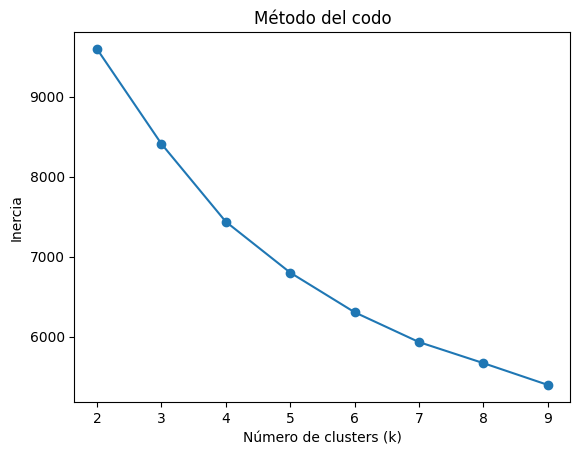

In [109]:

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()

X = df_kmeans[cols_numericas]
X_scaled = scaler.fit_transform(X)

# Aplicamos el método del codo para ver en cuantos clusters tiene sentido dividir. Por lógica deberían
# ser 3 o como mucho 4
inertias = []
k_range = range(2, 10)

for k in k_range:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(k_range, inertias, marker='o')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia')
plt.title('Método del codo')
plt.show()

In [ ]:
# No se ve claramente el punto de inflexion. Probamos con el silhouette score a ver...

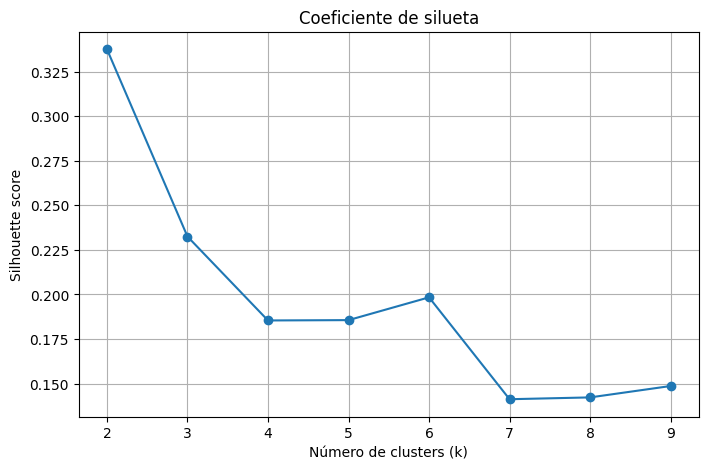

In [110]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

silhouette_scores = []
k_range = range(2, 10)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    silhouette_scores.append(score)

plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Coeficiente de silueta')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Silhouette score')
plt.grid(True)
plt.show()

In [ ]:
# Parece que el máximo está en K=2. No parece que con estos datos haya una clusterización fiable

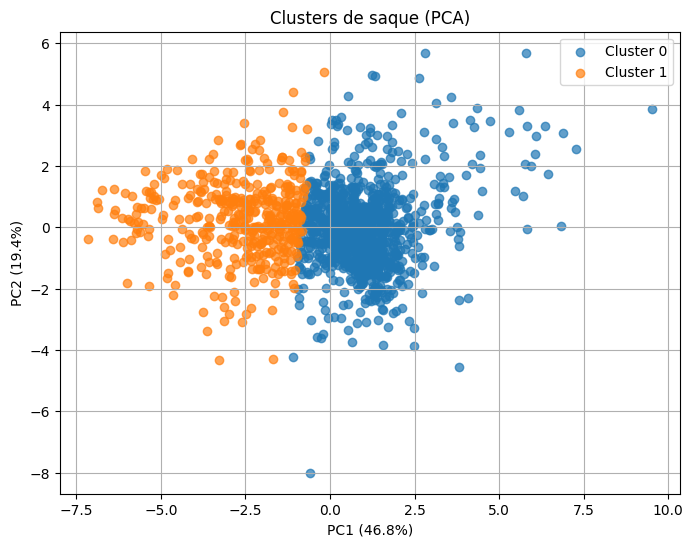

Varianza explicada total: 66.2%


In [111]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

kmeans_2 = KMeans(n_clusters=2, random_state=42)
labels = kmeans_2.fit_predict(X_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
for cluster in [0, 1]:
    mask = labels == cluster
    plt.scatter(X_pca[mask, 0], X_pca[mask, 1], label=f'Cluster {cluster}', alpha=0.7)

plt.title('Clusters de saque (PCA)')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
plt.legend()
plt.grid(True)
plt.show()

print(f"Varianza explicada total: {sum(pca.explained_variance_ratio_)*100:.1f}%")

 Vemos los saques en 2 clusters según similitudes en sus métricas (KMeans), y luego proyecta esos datos multidimensionales en 2 ejes que resumen la mayor varianza posible (PCA), permitiendo visualizarlos en un plano.

 PC1 (el eje horizontal, 46.8%) es el que realmente separa los dos clusters: el Cluster 1 (naranja) se agrupa a la izquierda y el Cluster 0 (azul) a la derecha, lo que indica que PC1 está capturando la diferencia principal entre los dos perfiles de saque. PC2 (vertical, 19.4%) apenas discrimina entre grupos, ambos se mezclan verticalmente. Hay una zona central con mucho solapamiento, lo cual es consistente con los scores de silueta moderados que obteníamos. Los clusters existen, pero no son grupos nítidos y bien separados, sino más bien dos extremos de un continuo. No aporta nada como feature

In [ ]:
# Explicación:
# w_ace	Number of aces by the winner (Integer)
# w_df	Number of double faults by the winner. (Integer)
# l_1stIn	Number of first serves in by the loser. (Integer)
# l_1stWon	Number of first serves won by the loser. (Integer)
# l_2ndWon	Number of second serves won by the loser. (Integer)
# l_SvGms	Number of service games won by the loser. (Integer)
# l_bpSaved	Number of break points saved by the loser. (Integer)
# l_bpFaced	Number of break points faced by the loser. (Integer)

In [4]:
stats_2024.head()

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,winner_rank,winner_rank_points,loser_rank,loser_rank_points
0,2024-9900,United Cup,Hard,18,I,20240101,299,216347,NaN,NaN,...,27.0,13.0,7.0,7.0,4.0,8.0,1.0,9505.0,NaN,NaN
1,2024-9900,United Cup,Hard,18,I,20240101,297,216347,NaN,NaN,...,47.0,28.0,7.0,12.0,3.0,8.0,1.0,9505.0,20.0,2330.0
2,2024-9900,United Cup,Hard,18,I,20240101,295,201493,NaN,NaN,...,82.0,47.0,10.0,15.0,11.0,19.0,NaN,NaN,292.0,246.0
3,2024-9900,United Cup,Hard,18,I,20240101,293,216347,NaN,NaN,...,27.0,18.0,6.0,8.0,6.0,11.0,1.0,9505.0,14.0,2770.0
4,2024-9900,United Cup,Hard,18,I,20240101,291,201614,NaN,NaN,...,72.0,51.0,22.0,16.0,3.0,6.0,20.0,2330.0,544.0,89.0


# Analisis de nuevas variables

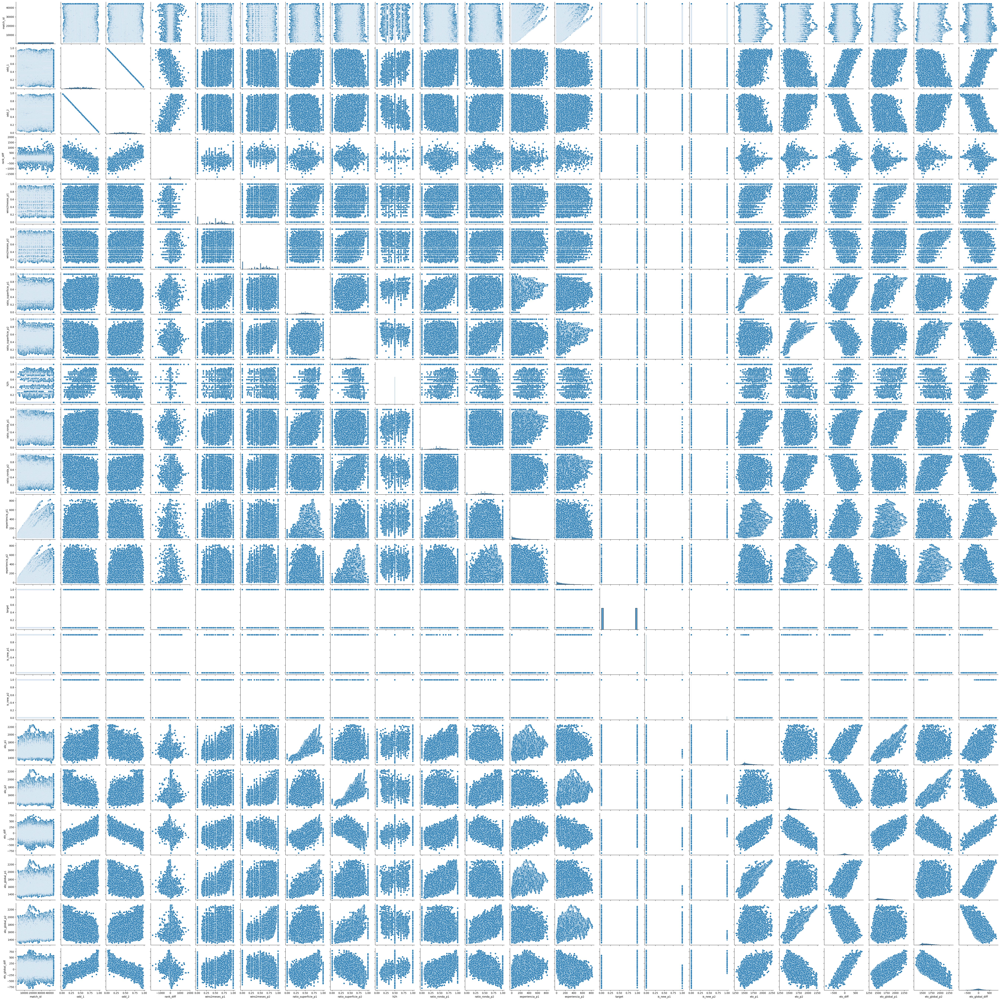

In [19]:
import seaborn as sns

sns.pairplot (data=historico_partidos)

<Axes: >

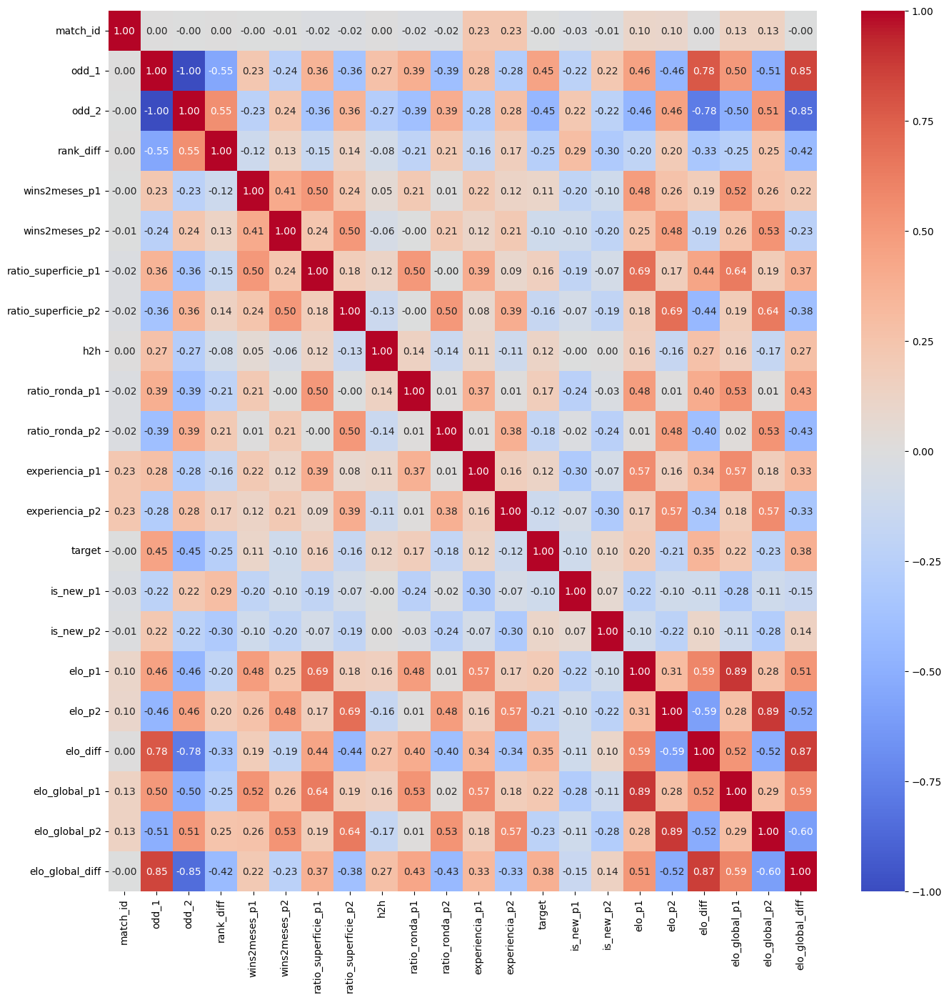

In [23]:
import matplotlib.pyplot as plt
plt.figure (figsize= (16,16))
sns.heatmap(
    historico_partidos.corr(numeric_only=True),
    annot=True,
    fmt='.2f',
    cmap='coolwarm'
)

# Features adicionales
Inactividad   
ELO